In [2]:
import cv2
import pickle
import sys
import os

sys.path.append(os.path.abspath(os.path.join("..", "src")))
from calibration_funcs import *
from utils import get_images, write_pickle

%load_ext autoreload
%autoreload 2

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
left_images, right_images = get_images("../datasets/budha_board/calib", "calib", print_info=True)

Found 28 left images and 28 right images
First left image: ..\datasets\budha_board\calib\calib_left_0.jpg
First right image: ..\datasets\budha_board\calib\calib_right_0.jpg


In [3]:
checkerboard, square_size_mm = load_checkerboard_config("../datasets/budha_board/checkerboard.txt")
print("checkerboard =", checkerboard)
print("square size (mm) =", square_size_mm)
checkerboard_world_points_mm = board_points(checkerboard) * square_size_mm

checkerboard = (10, 7)
square size (mm) = 24.2


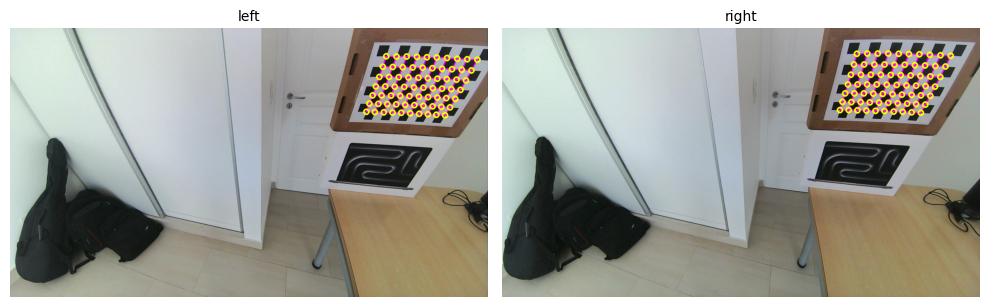

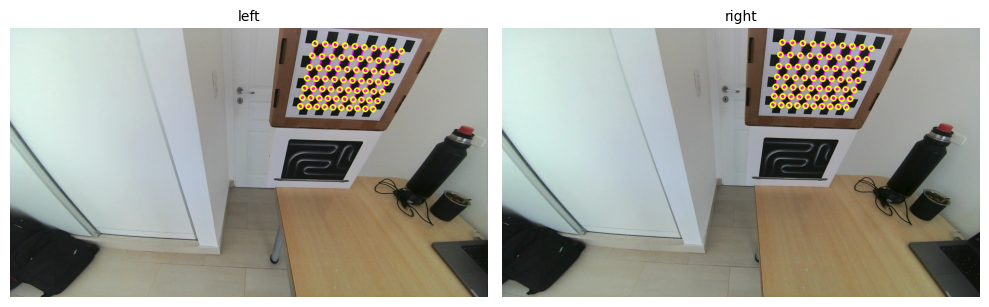

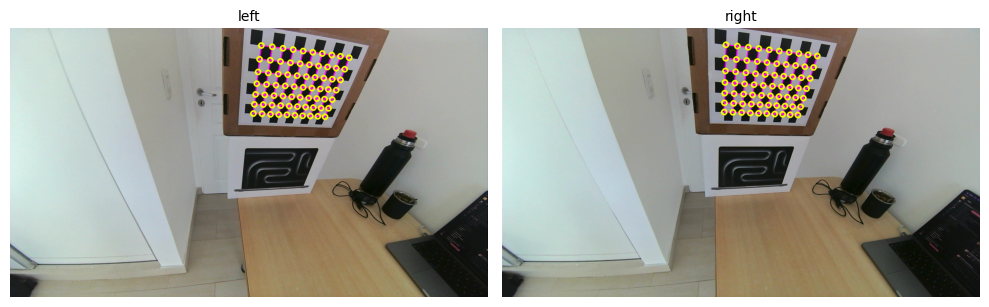

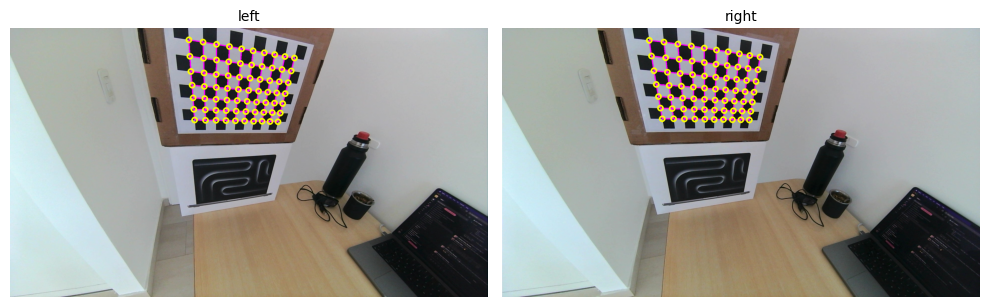

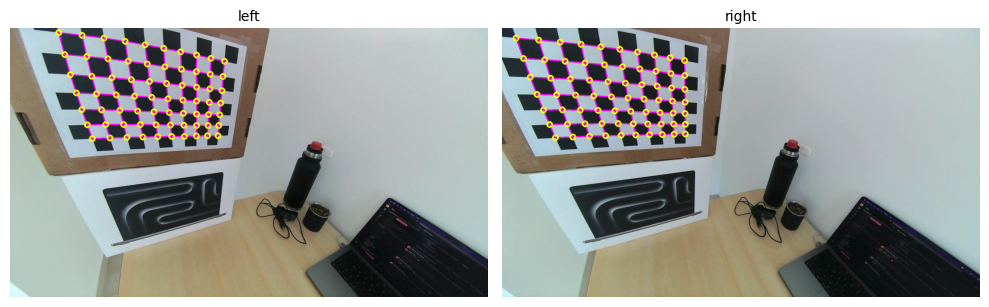

...

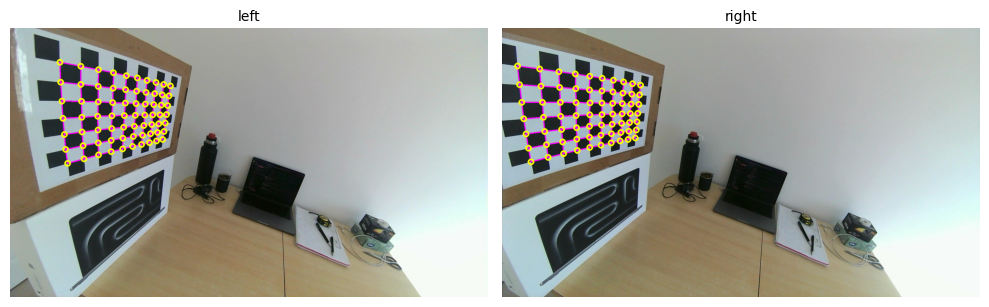

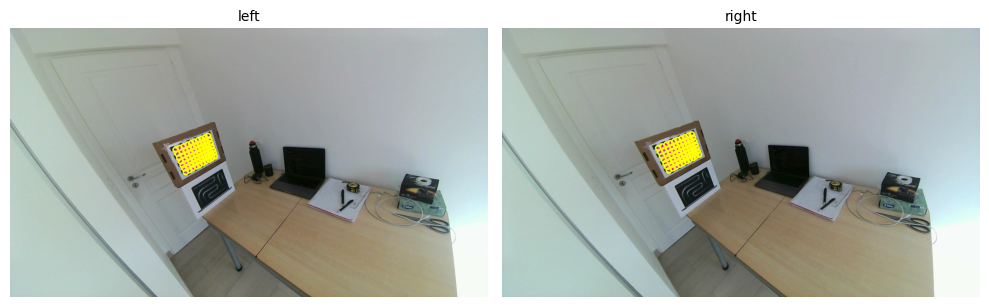

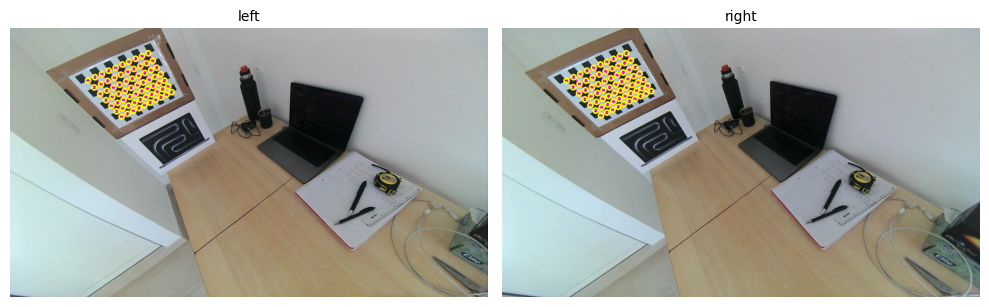

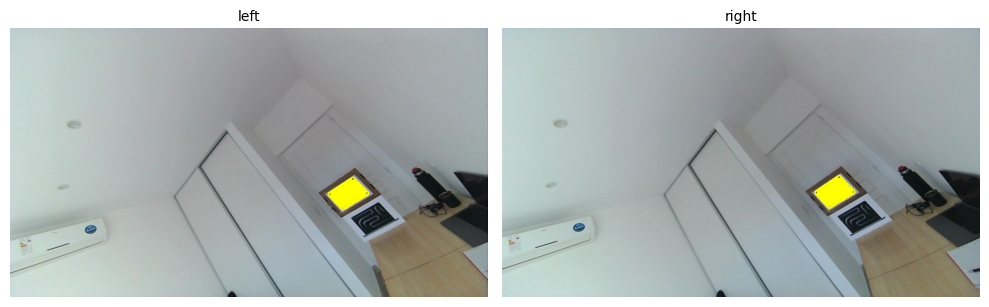

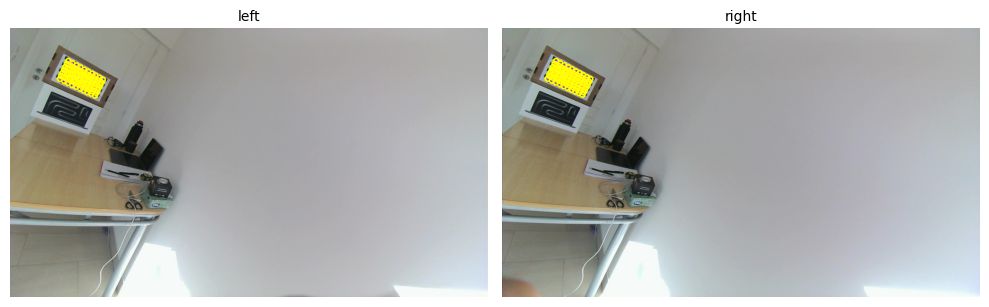

In [4]:
world_points, left_images_points, right_images_points, image_size = get_points_from_images(left_images, right_images, checkerboard, checkerboard_world_points_mm, print_info=False, show_boards=True)

In [5]:
err, left_K, left_dist, right_K, right_dist, R, T, E, F = cv2.stereoCalibrate(
    world_points, 
    left_images_points, 
    right_images_points, 
    None, 
    None, 
    None, 
    None, 
    image_size, 
    flags=0
)

In [6]:
calibration_results = {
    'left_K': left_K,
    'left_dist': left_dist,
    'right_K': right_K,
    'right_dist': right_dist,
    'R': R,
    'T': T,
    'E': E,
    'F': F,
    'image_size': image_size,
}

In [7]:
print_calib_info(calibration_results)

# STEREO CALIBRATION
# Left camera Intrinsics:
left_K = np.array([
	[   600.569,	     0.000,	   963.433],
	[     0.000,	   600.775,	   548.961],
	[     0.000,	     0.000,	     1.000]
])

left_dist = np.array([
	[  0.004782,	 -0.023202,	 -0.000496,	  0.001601,	  0.003510]
])

# Right camera Intrinsics:
right_K = np.array([
	[   600.059,	     0.000,	   960.028],
	[     0.000,	   599.822,	   535.499],
	[     0.000,	     0.000,	     1.000]
])

right_dist = np.array([
	[  0.001950,	 -0.021507,	 -0.000628,	  0.000322,	  0.003217]
])

# Rotation:
R = np.array([
	[     1.000,	    -0.000,	     0.010],
	[     0.000,	     1.000,	     0.010],
	[    -0.010,	    -0.010,	     1.000]
])

# Translation:
T = np.array([
	[-59.300838],
	[  0.584876],
	[ -0.325433]
])

# Essential Matrix:
E = np.array([
	[    -0.006,	     0.320,	     0.588],
	[    -0.917,	    -0.571,	    59.292],
	[    -0.589,	   -59.298,	    -0.577]
])

# Fundamental Matrix:
F = np.array([
	[     0.000,	    -0.000,	    -0.001],
	[     0.0

In [8]:
path = '../datasets/budha_board/calibration_results/stereo_calibration.pkl'
calibration_path = write_pickle(path, calibration_results)

In [9]:
with open(calibration_path, "rb") as f:
    calibration_results = pickle.loads(f.read())

In [10]:
images_path = "../datasets/budha_board/calib"
images_prefix = "calib"
checkerboard_path = "../datasets/budha_board/checkerboard.txt"
calib_pickle_path = "../datasets/budha_board/calibration_results/stereo_calibration.pkl"
print_info = True
calib_info = {
    "images_path": images_path,
    "images_prefix": images_prefix,
    "checkerboard_path": checkerboard_path,
    "calib_pickle_path": calib_pickle_path,
    "calib_done": False,
}
file_path = write_complete_calib_pickle(calib_info, print_info)

Found 28 left images and 28 right images
First left image: ..\datasets\budha_board\calib\calib_left_0.jpg
First right image: ..\datasets\budha_board\calib\calib_right_0.jpg
checkerboard = (10, 7)
square size (mm) = 24.2
processing image pair 1 of 28
processing image pair 2 of 28
processing image pair 3 of 28
processing image pair 4 of 28
processing image pair 5 of 28
processing image pair 6 of 28
processing image pair 7 of 28
processing image pair 8 of 28
processing image pair 9 of 28
processing image pair 10 of 28
processing image pair 11 of 28
processing image pair 12 of 28
processing image pair 13 of 28
processing image pair 14 of 28
processing image pair 15 of 28
processing image pair 16 of 28
processing image pair 17 of 28
processing image pair 18 of 28
processing image pair 19 of 28
processing image pair 20 of 28
processing image pair 21 of 28
processing image pair 22 of 28
processing image pair 23 of 28
processing image pair 24 of 28
processing image pair 25 of 28
processing ima